In [204]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt

from sklearn.preprocessing import MinMaxScaler

import sklearn
import sklearn.model_selection
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor

from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras import optimizers



from sklearn.metrics import mean_squared_error




In [200]:
def train_test_monthly(df, train_size = 0.8):
    train = []
    test = []

    for i in df.groupby(df.index.month):
        month_name = "M" + str(i[0])
        index = round(len(i[1])*train_size)
        train.append(i[1].iloc[:index,:])
        test.append(i[1].iloc[index:,:])
        
    train = pd.concat(train)
    test = pd.concat(test)
    return train, test

In [35]:
def prepare_forecasting_df(df, timestamp_column_name):

    #TODO: convert to local timezone
    df.dropna(inplace = True)
    df = df.reset_index()
    df = df[~df[timestamp_column_name].duplicated()]
    df = df.set_index(timestamp_column_name)
    return df

In [138]:
def rmse_(df_test):

    y = df_test.iloc[:,:1]
    mean = y.mean()

    rmse_values = {}

    for i in range(len(df_test.columns)-1):
        y_hat = df_test.iloc[:,i+1]


        rmse =  mean_squared_error(y, y_hat, squared=False)
        rmse_values[y_hat.name] = rmse, round(rmse/mean, 2)

    #print("RMSE is: {0}".format(round(rmse, 1)))
    #print("Percentage of the Mean: {0} %".format(100*round(rmse/y.mean(), 2)))
    #print("Percentage of the Max: {0} %".format(100*round(rmse/y.max(), 2)))
    #print("Percentage of the St. Deviation: {0} %".format(100*round(rmse/y.std(), 2)))
    return rmse_values

In [201]:
def plot_loss(history):

  plt.plot(history.history['loss'], label='loss')
  plt.plot(history.history['val_loss'], label='val_loss')
  plt.ylim([0, 10])
  plt.xlabel('Epoch')
  plt.ylabel('Error [MPG]')
  plt.legend()
  plt.grid(True)

In [246]:
df = pd.read_csv("/Users/nikolaushouben/Library/Mobile Documents/com~apple~CloudDocs/PhD/Other_Research/Hackathon/Data_merged_and_cleaned.csv", index_col= "timestamp", parse_dates=True)
df = df.iloc[:,:7]
df.drop(["Greenlands Windrush"], axis = 1, inplace = True)





In [247]:
df.fillna(0, inplace=True)
df[df["ssrd"]<0.1]["ssrd"] = 0

scaler = MinMaxScaler()

df_scaled = df
df_scaled[list(df_scaled.columns)] = scaler.fit_transform(df_scaled[list(df_scaled.columns)])

df_scaled = df_scaled[df_scaled["ssrd"] > 0]
df_scaled.loc[df_scaled["E Morley Main"] == 0, "ssrd"] = 0

<ipython-input-247-cb5b67cd893a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[df["ssrd"]<0.1]["ssrd"] = 0
/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:692: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

In [248]:
df_scaled

,E Morley Main,E Morley SBE,Wager,MERL Archive,Tesla,ssrd
timestamp,,,,,,
2020-06-01 03:30:00,0.000000,0.0,0.00000,0.000000,0.000000,0.000000
2020-06-01 04:00:00,0.000000,0.0,0.00000,0.000224,0.000000,0.000000
2020-06-01 04:30:00,0.004630,0.0,0.00510,0.008505,0.000000,0.021583
2020-06-01 05:00:00,0.039352,0.0,0.03010,0.022493,0.024327,0.043150
2020-06-01 05:30:00,0.085648,0.0,0.12500,0.039727,0.036212,0.109105
...,...,...,...,...,...,...
2021-05-31 19:30:00,0.034722,0.0,0.03010,0.043308,0.017979,0.113843
2021-05-31 20:00:00,0.011574,0.0,0.01015,0.015779,0.000000,0.047485
2021-05-31 20:30:00,0.002315,0.0,0.00000,0.001343,0.000000,0.023812


# Basic 30 min lag

In [249]:
# train a model for each windspeed

# take the wind speed forecast -> select model (specific lag 5,10,15,30) -> 

In [250]:
df_scaled.iloc[:,1:-1] = df_scaled.iloc[:,1:-1].shift(1)
df_scaled.dropna(inplace=True)

/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:692: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)
<ipython-input-250-dcd98ee79a61>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returnin

In [251]:
df_scaled

,E Morley Main,E Morley SBE,Wager,MERL Archive,Tesla,ssrd
timestamp,,,,,,
2020-06-01 04:00:00,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
2020-06-01 04:30:00,0.004630,0.000000,0.00000,0.000224,0.000000,0.021583
2020-06-01 05:00:00,0.039352,0.000000,0.00510,0.008505,0.000000,0.043150
2020-06-01 05:30:00,0.085648,0.000000,0.03010,0.022493,0.024327,0.109105
2020-06-01 06:00:00,0.150463,0.000000,0.12500,0.039727,0.036212,0.175061
...,...,...,...,...,...,...
2021-05-31 19:30:00,0.034722,0.041667,0.05975,0.087847,0.037039,0.113843
2021-05-31 20:00:00,0.011574,0.000000,0.03010,0.043308,0.017979,0.047485
2021-05-31 20:30:00,0.002315,0.000000,0.01015,0.015779,0.000000,0.023812


In [252]:
train, test = train_test_monthly(df_scaled)

# a) Benchmark Model (SSRD Only)

In [253]:
train_X_a = train[["ssrd"]]
train_y_a = train[["E Morley Main"]]

test_X_a = test[["ssrd"]]
test_y_a = test[["E Morley Main"]]

In [254]:
model = RandomForestRegressor()
model.fit(train_X_a, train_y_a)
test_y_a["predicted_RF"] = model.predict(test_X_a)

<ipython-input-254-5ad4bd680848>:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(train_X_a, train_y_a)
<ipython-input-254-5ad4bd680848>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_y_a["predicted_RF"] = model.predict(test_X_a)


In [255]:
ada_clf = AdaBoostRegressor(DecisionTreeRegressor(max_depth=20), n_estimators=500, learning_rate=0.5)
ada_clf.fit(train_X_a, train_y_a)
test_y_a["predicted_DT"] = ada_clf.predict(test_X_a)

/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
<ipython-input-255-f5469d1e6f05>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_y_a["predicted_DT"] = ada_clf.predict(test_X_a)


In [256]:
def build_and_compile_model(nodes):
  model = Sequential([
      layers.Dense(nodes, activation='elu'),
      layers.Dense(round(nodes*0.6), activation='elu'),
      layers.Dense(1)
  ])

  model.compile(loss='mean_absolute_error',
                optimizer=optimizers.Adam(0.001))
  return model

In [259]:
dnn_model = build_and_compile_model(100)

history = dnn_model.fit(
    train_X_a, train_y_a,
    validation_split=0.2,
    verbose=0, epochs=100)



In [260]:
#plot_loss(history)
x = dnn_model.evaluate(train_X_a, train_y_a, verbose=0)

test_y_a["predicted_MLP"] = dnn_model.predict(test_X_a).flatten()

<ipython-input-260-60d56862434e>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_y_a["predicted_MLP"] = dnn_model.predict(test_X_a).flatten()


In [262]:
test_y_a

,E Morley Main,predicted_RF,predicted_DT,predicted_MLP
timestamp,,,,
2021-01-26 10:00:00,0.039352,0.085440,0.099537,0.125524
2021-01-26 10:30:00,0.069444,0.100903,0.157407,0.166181
2021-01-26 11:00:00,0.083333,0.252847,0.217593,0.207654
2021-01-26 12:00:00,0.087963,0.573113,0.511863,0.387598
2021-01-26 12:30:00,0.067130,0.183750,0.303356,0.261116
...,...,...,...,...
2020-12-31 14:30:00,0.062500,0.202801,0.366872,0.246711
2020-12-31 15:00:00,0.055556,0.137037,0.172619,0.169029
2020-12-31 15:30:00,0.048611,0.076505,0.125000,0.102531


In [261]:
rmse_(test_y_a)

{'predicted_RF': (0.1519801988086614,
  E Morley Main    0.66
  dtype: float64),
 'predicted_DT': (0.15276694817445752,
  E Morley Main    0.66
  dtype: float64),
 'predicted_MLP': (0.12516072669542194,
  E Morley Main    0.54
  dtype: float64)}

/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


2020-06-25    AxesSubplot(0.125,0.125;0.775x0.755)
2020-06-26    AxesSubplot(0.125,0.125;0.775x0.755)
2020-06-27    AxesSubplot(0.125,0.125;0.775x0.755)
2020-06-28    AxesSubplot(0.125,0.125;0.775x0.755)
2020-06-29    AxesSubplot(0.125,0.125;0.775x0.755)
                              ...                 
2021-05-27    AxesSubplot(0.125,0.125;0.775x0.755)
2021-05-28    AxesSubplot(0.125,0.125;0.775x0.755)
2021-05-29    AxesSubplot(0.125,0.125;0.775x0.755)
2021-05-30    AxesSubplot(0.125,0.125;0.775x0.755)
2021-05-31    AxesSubplot(0.125,0.125;0.775x0.755)
Length: 73, dtype: object

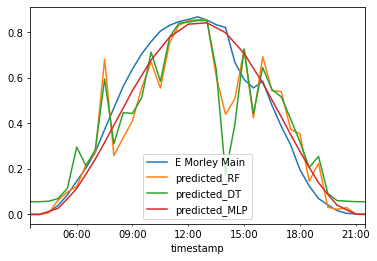

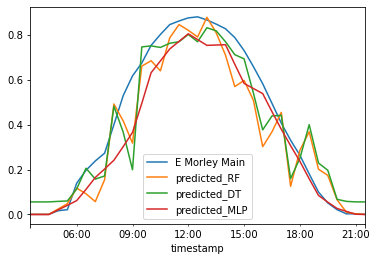

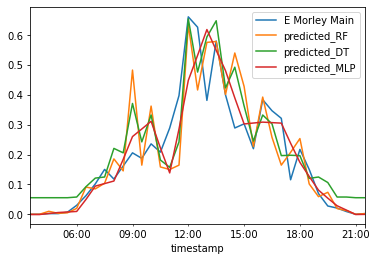

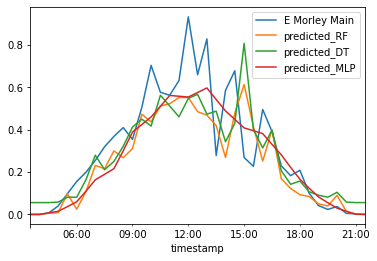

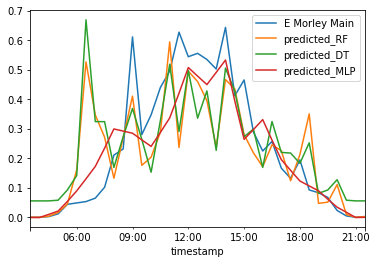

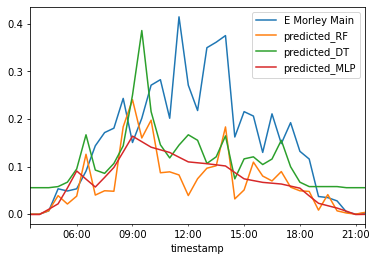

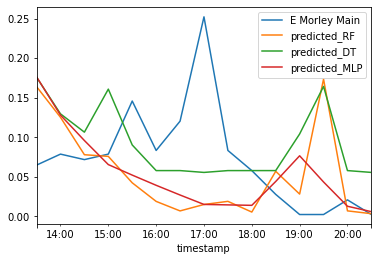

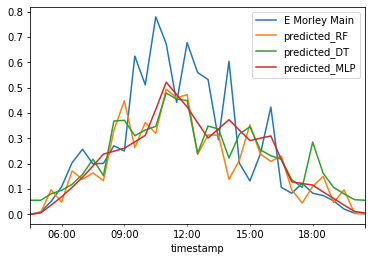

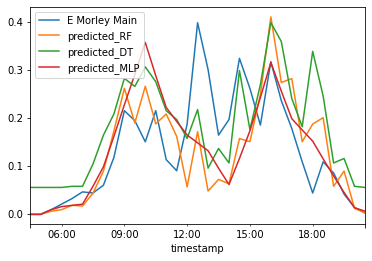

Error in callback <function flush_figures at 0x7fd705668820> (for post_execute):


KeyboardInterrupt: 

In [263]:
test_y_a.groupby(test_y_a.index.date).plot()

# b) Blackbox model with other station Lags + SSRD (without wind)

In [264]:
train_X_b = train[["ssrd", 'Wager', 'MERL Archive',
       'Tesla']]
       
train_y_b = train[["E Morley Main"]]

test_X_b = test[["ssrd", 'Wager', 'MERL Archive',"Tesla"]]
test_y_b = test[["E Morley Main"]]

In [265]:
model = RandomForestRegressor()
model.fit(train_X_b, train_y_b)
test_y_b["predicted_RF"] = model.predict(test_X_b)

<ipython-input-265-30a1ab3072f7>:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(train_X_b, train_y_b)
<ipython-input-265-30a1ab3072f7>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_y_b["predicted_RF"] = model.predict(test_X_b)


In [266]:
ada_clf = AdaBoostRegressor(DecisionTreeRegressor(max_depth=20), n_estimators=500, learning_rate=0.5)
ada_clf.fit(train_X_b, train_y_b)
test_y_b["predicted_DT"] = ada_clf.predict(test_X_b)

/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
<ipython-input-266-305a51609511>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_y_b["predicted_DT"] = ada_clf.predict(test_X_b)


In [267]:
dnn_model = build_and_compile_model(100)

history = dnn_model.fit(
    train_X_b, train_y_b,
    validation_split=0.2,
    verbose=0, epochs=100)


In [268]:
#plot_loss(history)
x = dnn_model.evaluate(train_X_b, train_y_b, verbose=0)

test_y_b["predicted_MLP"] = dnn_model.predict(test_X_b).flatten()

<ipython-input-268-bfc9f349cc95>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_y_b["predicted_MLP"] = dnn_model.predict(test_X_b).flatten()


/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


2020-06-25    AxesSubplot(0.125,0.125;0.775x0.755)
2020-06-26    AxesSubplot(0.125,0.125;0.775x0.755)
2020-06-27    AxesSubplot(0.125,0.125;0.775x0.755)
2020-06-28    AxesSubplot(0.125,0.125;0.775x0.755)
2020-06-29    AxesSubplot(0.125,0.125;0.775x0.755)
                              ...                 
2021-05-27    AxesSubplot(0.125,0.125;0.775x0.755)
2021-05-28    AxesSubplot(0.125,0.125;0.775x0.755)
2021-05-29    AxesSubplot(0.125,0.125;0.775x0.755)
2021-05-30    AxesSubplot(0.125,0.125;0.775x0.755)
2021-05-31    AxesSubplot(0.125,0.125;0.775x0.755)
Length: 73, dtype: object

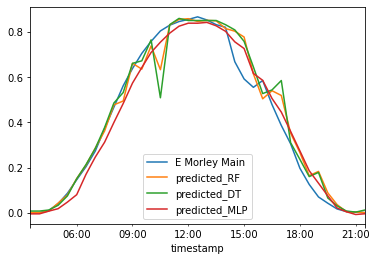

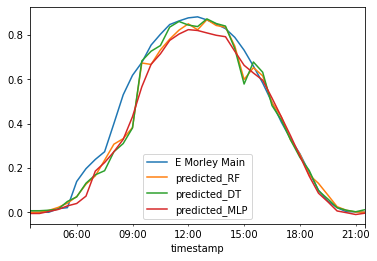

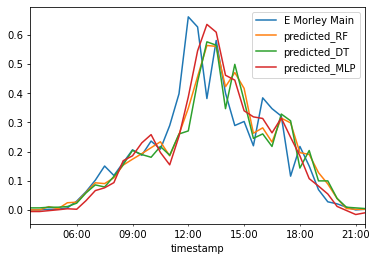

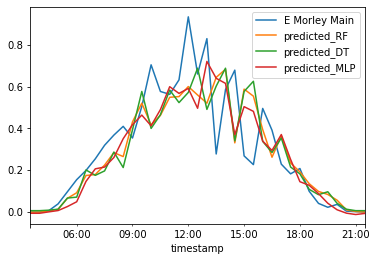

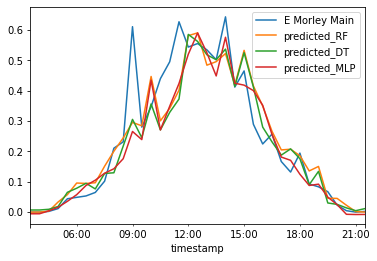

...

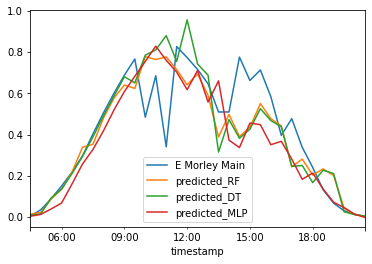

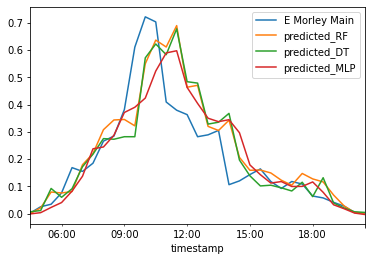

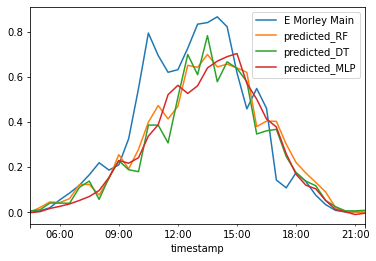

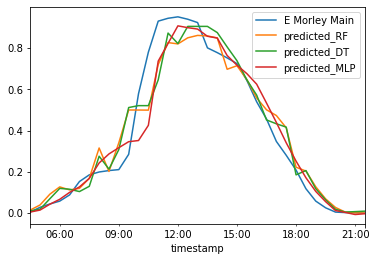

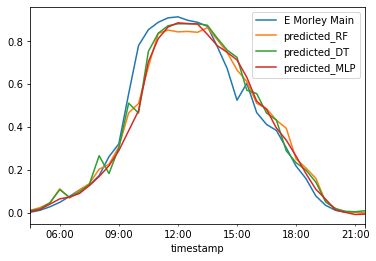

In [222]:
test_y_b.groupby(test_y_b.index.date).plot()

In [39]:
# close to 0 -> 0
# other algorithms
# a case where we just use the lag of the same station

In [269]:
rmse_(test_y_b)

{'predicted_RF': (0.0778194758023856,
  E Morley Main    0.34
  dtype: float64),
 'predicted_DT': (0.08416436535366294,
  E Morley Main    0.36
  dtype: float64),
 'predicted_MLP': (0.07597153764144353,
  E Morley Main    0.33
  dtype: float64)}

# c) Same station lags + SSRD

In [270]:
df_c = df_scaled[["E Morley Main", "ssrd"]]

In [271]:
df_c["lag_30"] = df_c["E Morley Main"].shift(1)
df_c.dropna(inplace=True)

<ipython-input-271-20d5d81e4c59>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_c["lag_30"] = df_c["E Morley Main"].shift(1)
<ipython-input-271-20d5d81e4c59>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_c.dropna(inplace=True)


In [272]:
train, test = train_test_monthly(df_c)

In [273]:
train_X_c = train[["ssrd", "lag_30"]]
train_y_c = train[["E Morley Main"]]

test_X_c = test[["ssrd", "lag_30"]]
test_y_c = test[["E Morley Main"]]

In [274]:
model = RandomForestRegressor()
model.fit(train_X_c, train_y_c)
test_y_c["predicted_RF"] = model.predict(test_X_c)

<ipython-input-274-68feee4aed42>:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(train_X_c, train_y_c)
<ipython-input-274-68feee4aed42>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_y_c["predicted_RF"] = model.predict(test_X_c)


In [275]:
ada_clf = AdaBoostRegressor(DecisionTreeRegressor(max_depth=20), n_estimators=500, learning_rate=0.5)
ada_clf.fit(train_X_c, train_y_c)
test_y_c["predicted_DT"] = ada_clf.predict(test_X_c)

/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


In [276]:
dnn_model = build_and_compile_model(100)

history = dnn_model.fit(
    train_X_c, train_y_c,
    validation_split=0.2,
    verbose=0, epochs=100)


#plot_loss(history)
x = dnn_model.evaluate(train_X_c, train_y_c, verbose=0)

test_y_c["predicted_MLP"] = dnn_model.predict(test_X_c).flatten()

In [277]:
rmse_(test_y_c)

{'predicted_RF': (0.09494071801321624,
  E Morley Main    0.41
  dtype: float64),
 'predicted_DT': (0.10104014157559998,
  E Morley Main    0.44
  dtype: float64),
 'predicted_MLP': (0.08512009721638167,
  E Morley Main    0.37
  dtype: float64)}

/Users/nikolaushouben/opt/anaconda3/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


2020-06-25    AxesSubplot(0.125,0.125;0.775x0.755)
2020-06-26    AxesSubplot(0.125,0.125;0.775x0.755)
2020-06-27    AxesSubplot(0.125,0.125;0.775x0.755)
2020-06-28    AxesSubplot(0.125,0.125;0.775x0.755)
2020-06-29    AxesSubplot(0.125,0.125;0.775x0.755)
                              ...                 
2021-05-27    AxesSubplot(0.125,0.125;0.775x0.755)
2021-05-28    AxesSubplot(0.125,0.125;0.775x0.755)
2021-05-29    AxesSubplot(0.125,0.125;0.775x0.755)
2021-05-30    AxesSubplot(0.125,0.125;0.775x0.755)
2021-05-31    AxesSubplot(0.125,0.125;0.775x0.755)
Length: 79, dtype: object

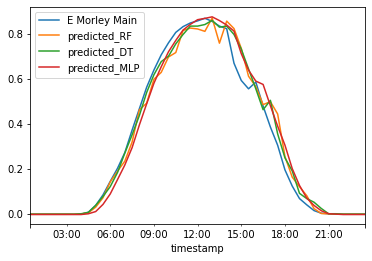

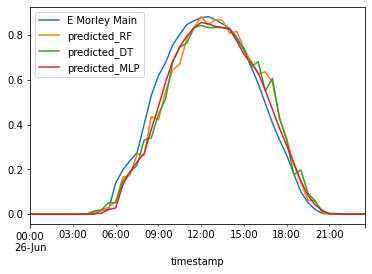

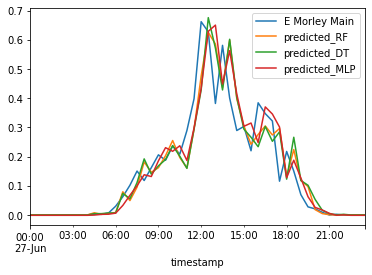

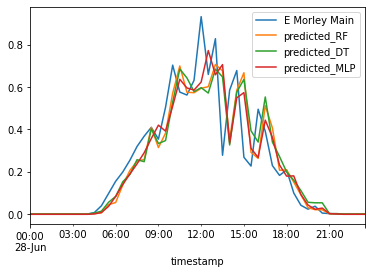

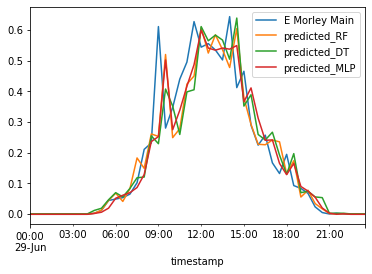

...

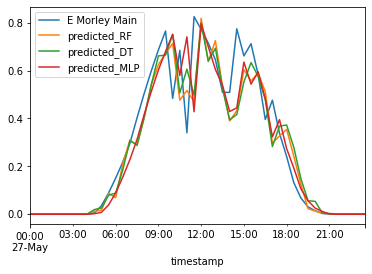

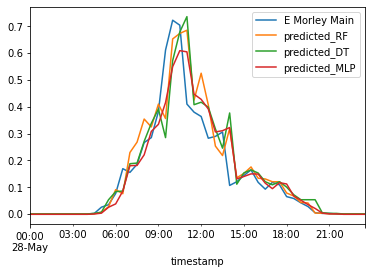

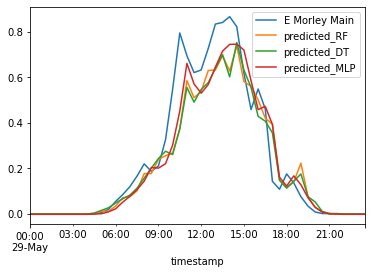

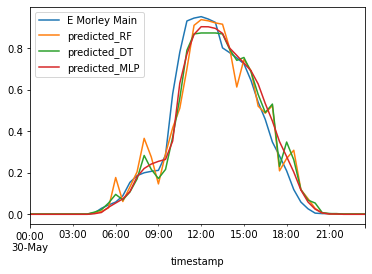

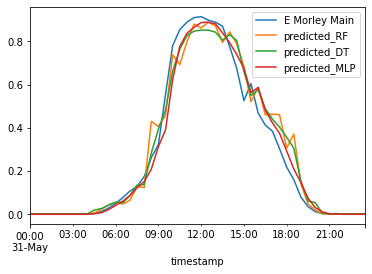

In [232]:
test_y_c.groupby(test_y_c.index.date).plot(legend = str(test_y_c.index.date))